In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [2]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

In [3]:
image = cv2.imread('Dataset/Corner-kick/ck_image.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [5]:
import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())


PyTorch version: 2.5.1+cu124
Torchvision version: 0.20.1+cu124
CUDA is available: True


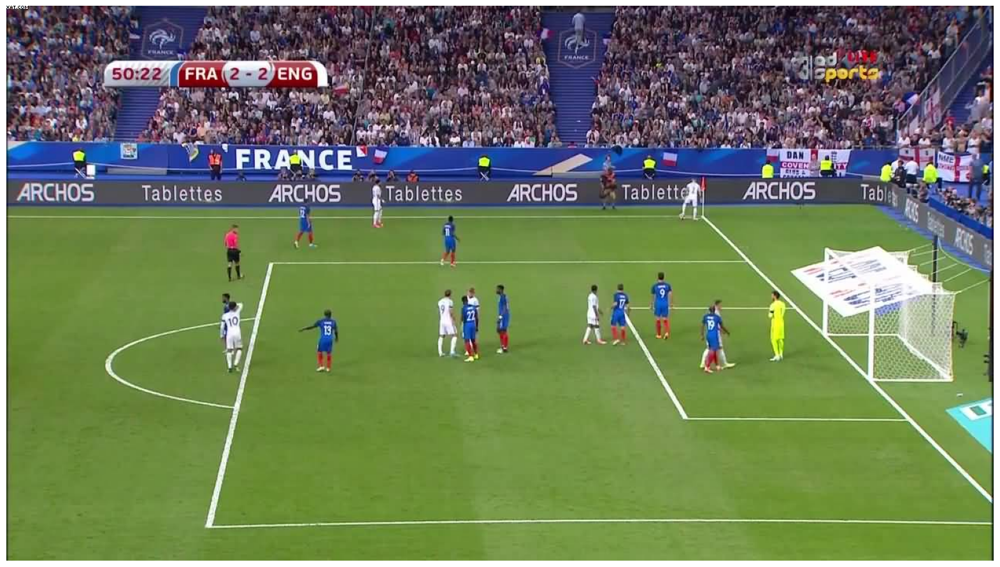

In [6]:
plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')
plt.show()

In [7]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

d:\yutol\Capstone\T2I-soccer-cornerkick-freekick\T2IEnv\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch

In [8]:
masks = mask_generator.generate(image)

In [9]:
print(len(masks))
print(masks[0].keys())

83
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


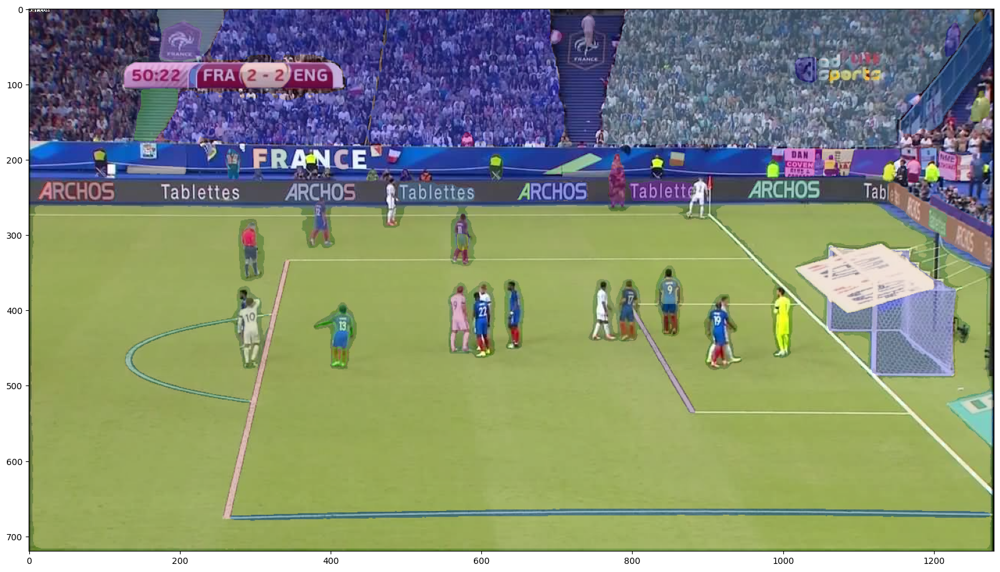

In [15]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks)
plt.axis('on')
plt.show() 

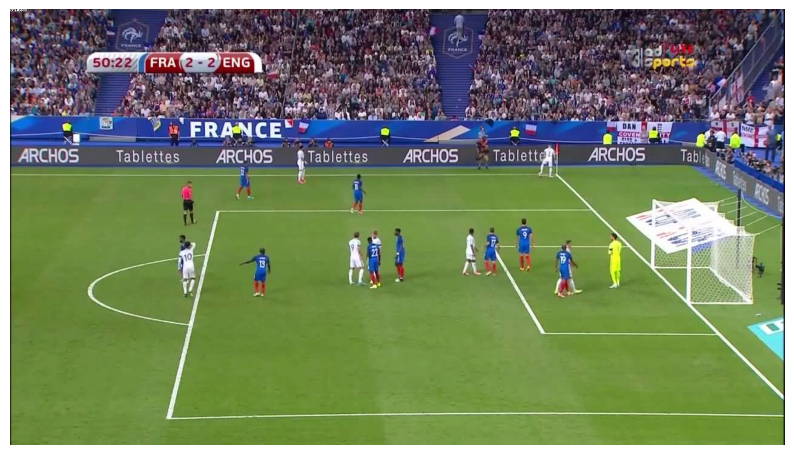

检测到的球员数量: 22
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


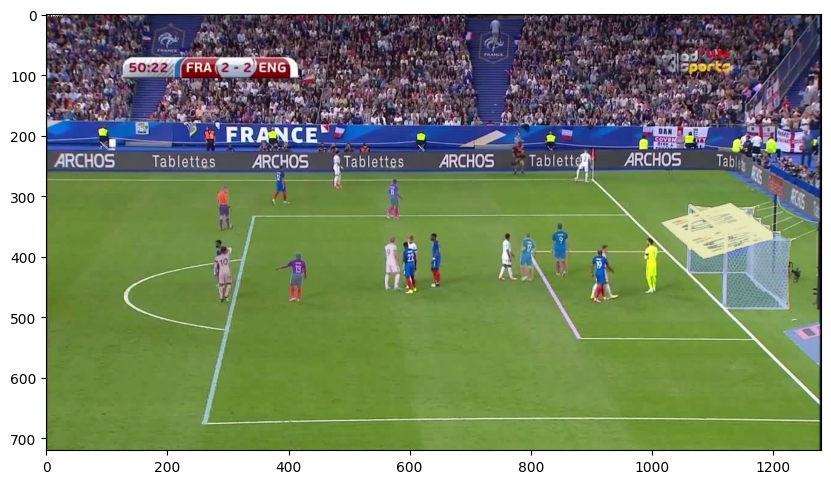

In [3]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

image = cv2.imread('Dataset/Corner-kick/ck_image.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('off')
plt.show()

import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

# 生成所有 masks
masks = mask_generator.generate(image)

# 过滤符合 X 轴大于 200 小于 1000，Y 轴大于 260 的球员
filtered_masks = [
    mask for mask in masks 
    if mask['bbox'][0] > 200 and mask['bbox'][2] < 1000 and mask['bbox'][1] > 260
]

print(f"检测到的球员数量: {len(filtered_masks)}")
print(filtered_masks[0].keys() if filtered_masks else "No players detected")

plt.figure(figsize=(10,10))
plt.imshow(image)
show_anns(filtered_masks)  # 只显示符合条件的 masks
plt.axis('on')
plt.show()


In [11]:
mask_generator_2 = SamAutomaticMaskGenerator(
    model=sam,
    points_per_side=32,
    pred_iou_thresh=0.86,
    stability_score_thresh=0.92,
    crop_n_layers=1,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=100,  # Requires open-cv to run post-processing
)

In [12]:
masks2 = mask_generator_2.generate(image)

In [13]:
len(masks2)

178

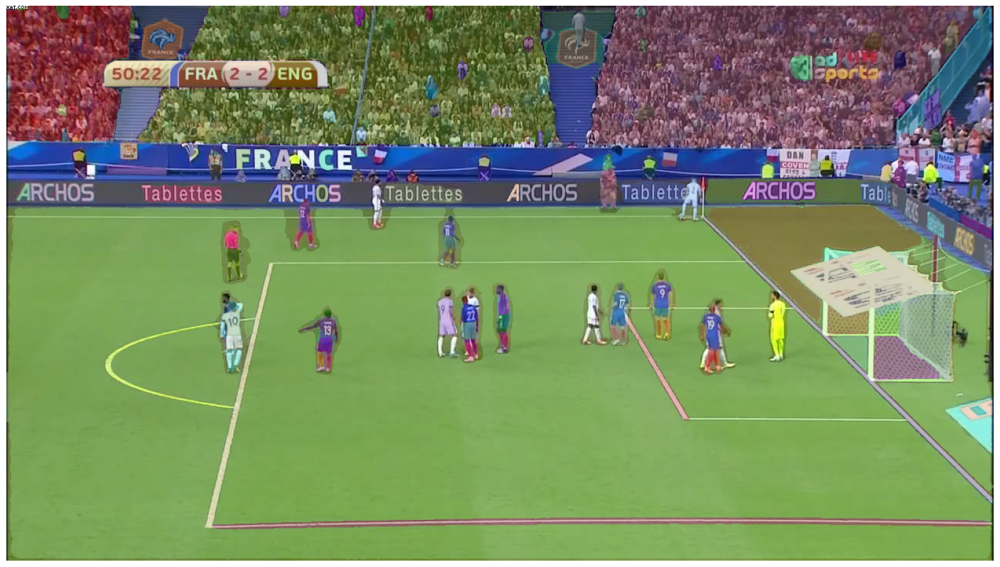

In [14]:
plt.figure(figsize=(20,20))
plt.imshow(image)
show_anns(masks2)
plt.axis('off')
plt.show() 

d:\yutol\Capstone\T2I-soccer-cornerkick-freekick\T2IEnv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\yutol\Capstone\T2I-soccer-cornerkick-freekick\T2IEnv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 22987 (\N{CJK UNIFIED IDEOGRAPH-59CB}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\yutol\Capstone\T2I-soccer-cornerkick-freekick\T2IEnv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 22270 (\N{CJK UNIFIED IDEOGRAPH-56FE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\yutol\Capstone\T2I-soccer-cornerkick-freekick\T2IEnv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 20687 (\N{CJK UNIFIED IDEOGRAPH-50CF}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


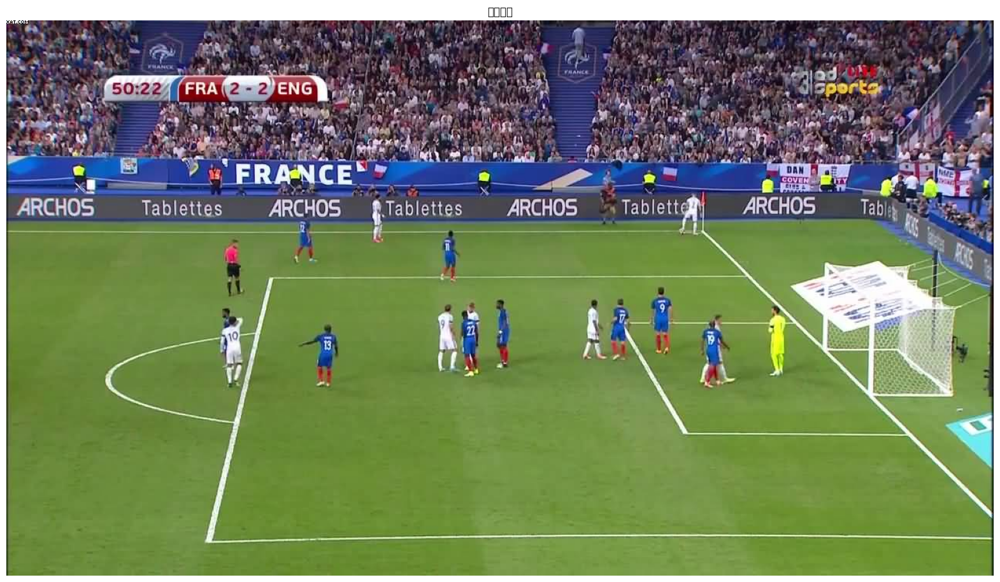

d:\yutol\Capstone\T2I-soccer-cornerkick-freekick\T2IEnv\Lib\site-packages\segment_anything\build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch

检测到的球员数量: 22
dict_keys(['segmentation', 'area', 'bbox', 'predicted_iou', 'point_coords', 'stability_score', 'crop_box'])


d:\yutol\Capstone\T2I-soccer-cornerkick-freekick\T2IEnv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 29699 (\N{CJK UNIFIED IDEOGRAPH-7403}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\yutol\Capstone\T2I-soccer-cornerkick-freekick\T2IEnv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 21592 (\N{CJK UNIFIED IDEOGRAPH-5458}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\yutol\Capstone\T2I-soccer-cornerkick-freekick\T2IEnv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 38543 (\N{CJK UNIFIED IDEOGRAPH-968F}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\yutol\Capstone\T2I-soccer-cornerkick-freekick\T2IEnv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 26426 (\N{CJK UNIFIED IDEOGRAPH-673A}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
d:\yutol\Capstone\T2I-soccer-cornerkick-

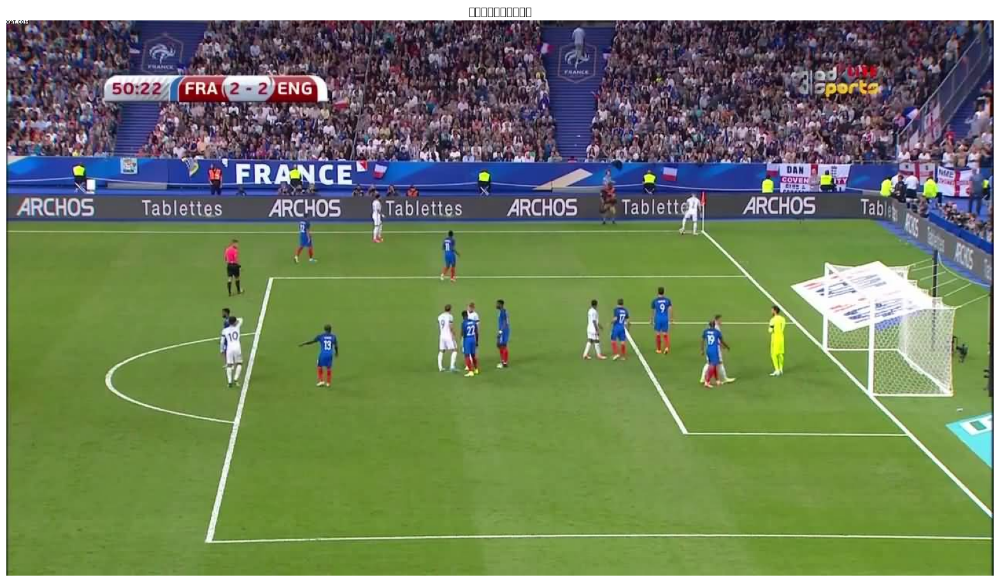

In [1]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2
import random
import sys

sys.path.append("..")
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator

def move_and_inpaint(image, anns, x_range=(200, 1000), y_min=260):
    """ 随机移动球员，并使用草地填补原位置 """
    image_moved = image.copy()
    inpaint_mask = np.zeros(image.shape[:2], dtype=np.uint8)

    # 创建一个列表来存储所有球员的新位置
    new_positions = []

    for ann in anns:
        x0, y0, x1, y1 = ann['bbox']
        h, w = y1 - y0, x1 - x0

        if h <= 0 or w <= 0:
            continue

        # 记录原始位置用于填充
        inpaint_mask[y0:y1, x0:x1] = 255

        # 随机生成新位置，确保在允许范围内
        new_x0 = random.randint(x_range[0], x_range[1] - w)
        new_y0 = random.randint(y_min, image.shape[0] - h)
        new_x1, new_y1 = new_x0 + w, new_y0 + h

        # 检查新位置是否与其他球员重叠
        overlap = any(
            (np.abs(new_x0 - pos[0]) < w and np.abs(new_y0 - pos[1]) < h)
            for pos in new_positions
        )

        # 如果重叠，重新生成位置（最多尝试10次）
        attempts = 0
        while overlap and attempts < 10:
            new_x0 = random.randint(x_range[0], x_range[1] - w)
            new_y0 = random.randint(y_min, image.shape[0] - h)
            new_x1, new_y1 = new_x0 + w, new_y0 + h
            overlap = any(
                (np.abs(new_x0 - pos[0]) < w and np.abs(new_y0 - pos[1]) < h)
                for pos in new_positions
            )
            attempts += 1

        # 如果找到了合适的新位置，移动球员
        if not overlap:
            new_positions.append((new_x0, new_y0))
            player_patch = image[y0:y1, x0:x1].copy()
            image_moved[new_y0:new_y1, new_x0:new_x1] = player_patch

    # 使用 OpenCV 进行 inpainting
    image_inpainted = cv2.inpaint(image_moved, inpaint_mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

    return image_inpainted

# 加载图像
image = cv2.imread('Dataset/Corner-kick/ck_image.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,20))
plt.imshow(image)
plt.axis('off')
plt.title("原始图像")
plt.show()

# 加载 SAM 模型
sam_checkpoint = "sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)

# 生成 mask
masks = mask_generator.generate(image)

# 筛选 X 在 (200, 1000)，Y > 260 的球员
filtered_masks = [
    mask for mask in masks 
    if mask['bbox'][0] > 200 and mask['bbox'][2] < 1000 and mask['bbox'][1] > 260
]

print(f"检测到的球员数量: {len(filtered_masks)}")
print(filtered_masks[0].keys() if filtered_masks else "No players detected")

# 移动球员，并用草地修补原位置
image_moved = move_and_inpaint(image, filtered_masks, x_range=(200, 1000), y_min=260)

# 显示修复后的图像
plt.figure(figsize=(20,20))
plt.imshow(image_moved)
plt.axis('off')
plt.title("球员随机移动后的图像")
plt.show()
